<a href="https://colab.research.google.com/github/maleal2/Assignment-3.1-Object-Detection-and-Segmentation/blob/main/MariaLeal_Assignment3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- **Name**: Maria Carolina Leal Cardenas.
- **Date**: 11/10/2024.

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pylab as plt
import matplotlib.patches as patches
import numpy as np
import cv2

# Part 1 - Object Segmentation

Object detection is a task in computer vision that involves identifying the presence, location, and type of one or more objects in a given image. In order to have an accurate object detection model, we need to train a model based of thousands or millions of images related to that object and this makes the task even more challenging. As was mentioned in week 2, even after finding appropriate data, training the model is not an easy task. We discussed one solution which was using pre-trained models. COCO is a large-scale object detection, segmentation, and captioning dataset.

a) Load the image dataset oxford_iiit from tf

In [22]:
#a) Load the oxford_iiit_pet dataset

dataset, info = tfds.load('oxford_iiit_pet', with_info=True, as_supervised=False)

In [23]:
# Preprocessing function


def read_and_preprocess(data):
    input_image = tf.image.resize(data['image'], (128, 128))  # Resize to 128x128
    input_mask = tf.image.resize(data['segmentation_mask'], (128, 128))  # Resize mask to 128x128

    input_image = tf.image.convert_image_dtype(input_image, tf.float32)  # Normalize image to [0, 1]
    input_mask -= 1  # Adjust mask labels from {1, 2, 3} to {0, 1, 2}

    return input_image, input_mask


In [24]:
train = dataset['train'].map(read_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
test = dataset['test'].map(read_and_preprocess)

b) Create the segmentation mask on the first 3 samples in the dataset. Show both the image and the segmented version of it. Remember to map the images into 128x128.

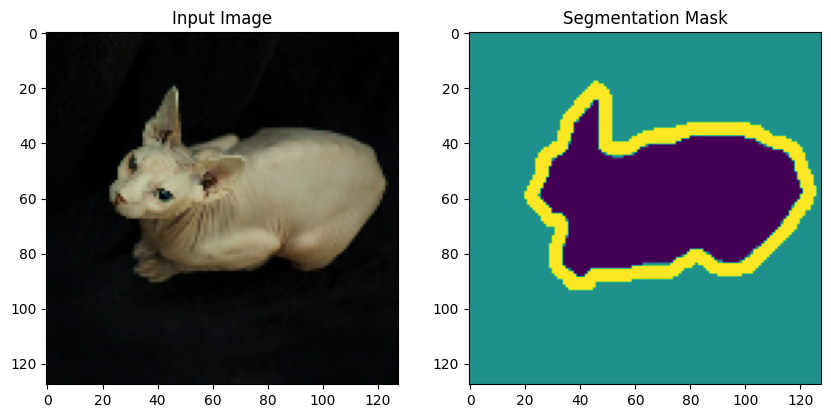

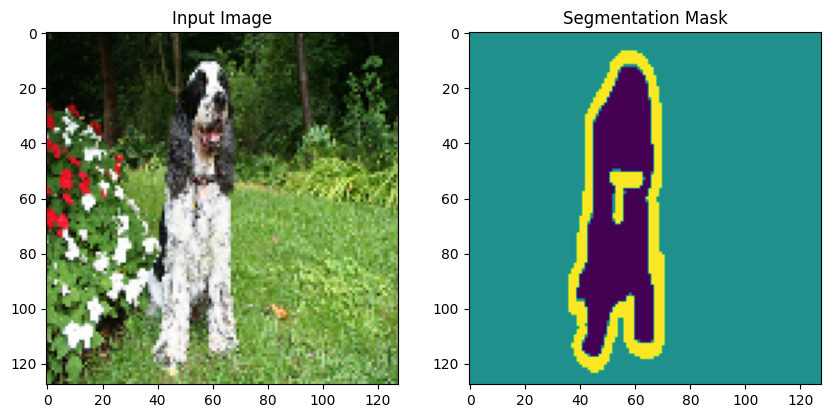

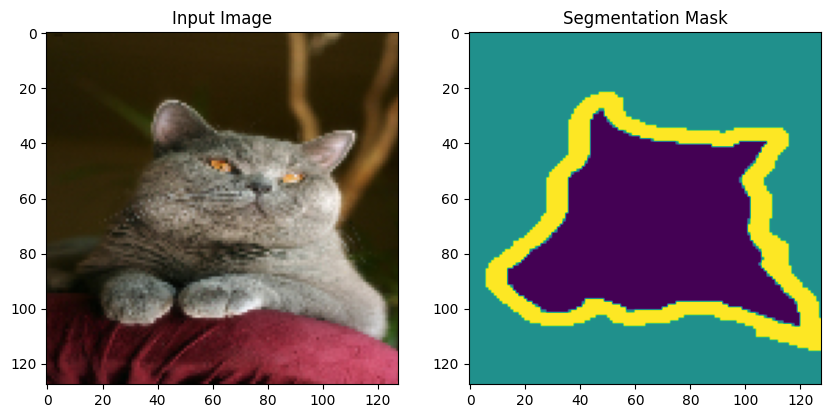

In [27]:
import numpy as np

# Function to display an image and its segmentation mask
def display_sample(image, mask):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Input Image')
    plt.imshow(image / 255) # Dividing the image by 255 when passing it to plt.imshow() ensures the pixel values are in the [0,1] range, as required by matplotlib for floats.

    plt.subplot(1, 2, 2)
    plt.title('Segmentation Mask')
    plt.imshow(mask.astype(np.uint8)) # .astype(np.uint8) ensures the segmentation mask values are integers.  Optional , we can display the mask segmentation in colormap "gray" by adding (, cmap ='gray')

    plt.show()

# Display first 3 samples from the training set
for image, mask in train.take(3):
    display_sample(image.numpy(), mask.numpy())

# Part 2- Annotation

One important aspect of data segmentation and object detection is to have the annotation of the images. In this part, we want to look into annotations of a sample dataset. Download the dataset from here:

https://github.com/experiencor/raccoon_dataset


In [28]:
# Install mrcnn
!pip install mrcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.5/51.5 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mrcnn: filename=mrcnn-0.2-py3-none-any.whl size=54907 sha256=8f5a37f4c0c7d32862d560d2db1ab40b3912e5a86444357cfdcce614d805e5c8
  Stored in directory: /root/.cache/pip/wheels/f6/66/35/4956a489776a1db0ee24e0c33a9088c1b5d68eb5dc2654f0b2
Successfully built mrcnn


In [30]:
# Get data from here https://github.com/experiencor/raccoon_dataset

!git clone https://github.com/experiencor/raccoon_dataset.git

Cloning into 'raccoon_dataset'...
remote: Enumerating objects: 646, done.
remote: Counting objects: 100% (646/646), done.
remote: Compressing objects: 100% (232/232), done.
remote: Total 646 (delta 413), reused 643 (delta 412), pack-reused 0 (from 0)
Receiving objects: 100% (646/646), 48.00 MiB | 15.35 MiB/s, done.
Resolving deltas: 100% (413/413), done.


a) Like before, show some samples of the images

In [32]:
import os
from PIL import Image

In [31]:
# Defining dataset path
dataset_path = '/content/raccoon_dataset/images'

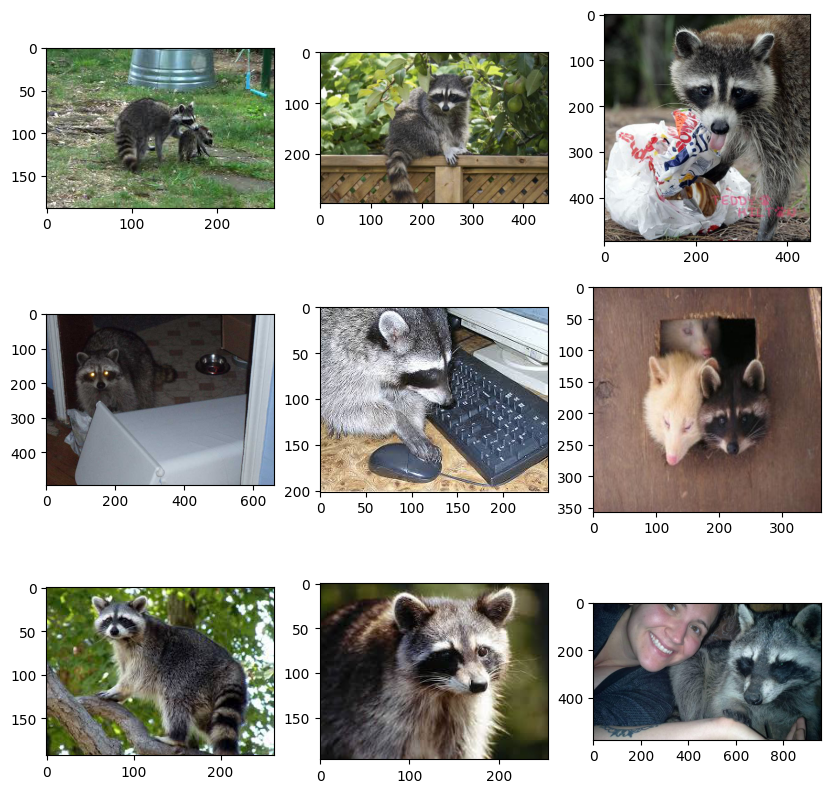

In [34]:

# Look into data
# Plot some samples here

# List of image files
image_files = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]

# Displaying  9 images

def show_images(image_files, num_images=9) :
    plt.figure(figsize=(10,10))
    for i in range(num_images):
        plt.subplot(3,3,i+1)
        img = Image.open(image_files[i])
        plt.imshow(img)
        plt.axis('on')
    plt.show()

# Show 9 sample images
show_images(image_files)

b) A class of fubctions is provided for you that creates mask and images. Use the provided class and create a sample of image and its mask.

In [40]:
from os import listdir
from xml.etree import ElementTree  # For parsing the XML annotation files
from numpy import zeros
from numpy import asarray	# Used for creating mask and handling numerical data
from mrcnn.utils import Dataset # The provided RaccoonDataset inherits from this class

# class that defines and loads the raccoon dataset
class RaccoonDataset(Dataset):
	# load the dataset definitions
	def load_dataset(self, dataset_dir, is_train=True):
		# define one class
		self.add_class("raccoon_dataset", 1, "raccoon")
		# define data locations
		images_dir = dataset_dir + '/images/'
		annotations_dir = dataset_dir + '/annotations/raccoon-'
		# find all images
		for filename in listdir(images_dir):
			# extract image id
			image_id = filename[8:-4]
			# skip bad images
			if image_id in ['00090']:
				continue
			# skip all images after 150 if we are building the train set
			if is_train and int(image_id) >= 150:
				continue
			# skip all images before 150 if we are building the test/val set
			if not is_train and int(image_id) < 150:
				continue
			img_path = images_dir + filename
			ann_path = annotations_dir + image_id + '.xml'
			# add to dataset
			self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)

	# extract bounding boxes from an annotation file
	def extract_boxes(self, filename):
		# load and parse the file
		tree = ElementTree.parse(filename)
		# get the root of the document
		root = tree.getroot()
		# extract each bounding box
		boxes = list()
		for box in root.findall('.//bndbox'):
			xmin = int(box.find('xmin').text)
			ymin = int(box.find('ymin').text)
			xmax = int(box.find('xmax').text)
			ymax = int(box.find('ymax').text)
			coors = [xmin, ymin, xmax, ymax]
			boxes.append(coors)
		# extract image dimensions
		width = int(root.find('.//size/width').text)
		height = int(root.find('.//size/height').text)
		return boxes, width, height

	# load the masks for an image
	def load_mask(self, image_id):
		# get details of image
		info = self.image_info[image_id]
		# define box file location
		path = info['annotation']
		# load XML
		path = '/content/raccoon_dataset/annotations/raccoon-' + str(info['id']) + '.xml'
		boxes, w, h = self.extract_boxes(path)
		# create one array for all masks, each on a different channel
		masks = zeros([h, w, len(boxes)], dtype='uint8')
		# create masks
		class_ids = list()
		for i in range(len(boxes)):
			box = boxes[i]
			row_s, row_e = box[1], box[3]
			col_s, col_e = box[0], box[2]
			masks[row_s:row_e, col_s:col_e, i] = 1
			class_ids.append(self.class_names.index('raccoon'))
		return masks, asarray(class_ids, dtype='int32')

	# load an image reference
	def image_reference(self, image_id):
		info = self.image_info[image_id]
		return info['path']

# train set
train_set = RaccoonDataset()
train_set.load_dataset('raccoon_dataset', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

# test/val set
test_set = RaccoonDataset()
test_set.load_dataset('raccoon_dataset', is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Train: 149
Test: 51


In [51]:
# load an image
# Use the function above to create the image and its mask

def visualize_sample_with_overlay(dataset, image_id):
    """
    Visualize a sample image with its mask overlaid.

    Args:
    - dataset: The dataset object (train or test).
    - image_id: The ID of the image to visualize.
    """
    # Load the image
    image = dataset.load_image(image_id)

    # Load the mask and class IDs
    mask, class_ids = dataset.load_mask(image_id)

    # Combine all masks into one for overlay
    combined_mask = np.sum(mask, axis=-1)

    # Plot the image with the mask overlay
    fig, ax = plt.subplots(1, figsize=(10, 8))

    # Display the original image
    ax.imshow(image)
    ax.axis('on')

    # Overlay the mask on the image
    ax.imshow(combined_mask, cmap='jet', alpha=0.5)  # colormap 'jet' with transparency

    # Optionally, add bounding boxes around each object
    for i, box in enumerate(dataset.extract_boxes(dataset.image_info[image_id]['annotation'])[0]):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    plt.title("Image with Mask Overlay")
    plt.show()


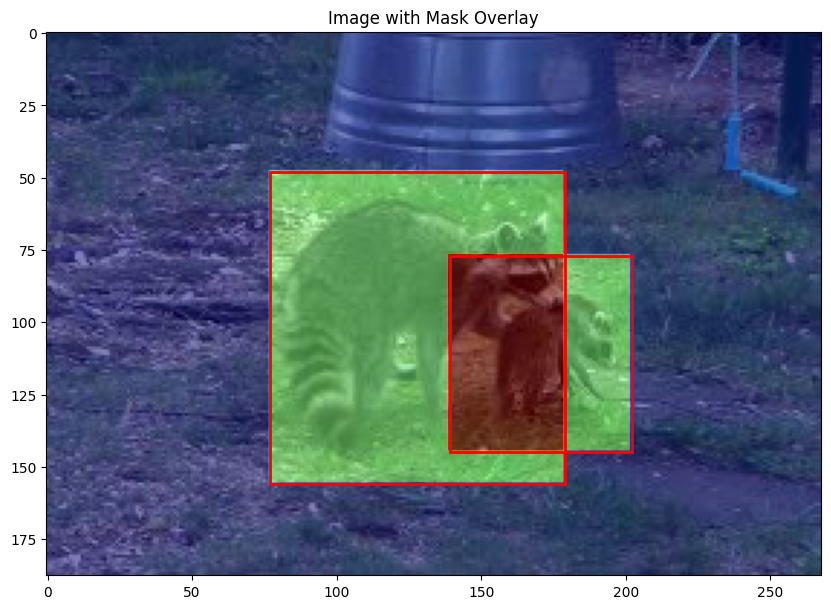

In [52]:
# Visualize a sample image with its mask and bounding boxes from the train set
visualize_sample_with_overlay(train_set, train_set.image_ids[0])


# Part 3- YOLO




In 2016, researchers at Washington University, Allen Institute for AI, and Facebook AI Research proposed “You Only Look Once” (YOLO), a family of neural networks that improved the speed and accuracy of object detection with deep learning.
The main improvement in YOLO is the integration of the entire object detection and classification process in a single network. Instead of extracting features and regions separately, YOLO performs everything in a single pass through a single network, hence the name “You Only Look Once.”
YOLOv10, developed by researchers at Tsinghua University using the Ultralytics Python package, offers a novel approach to real-time object detection. It addresses post-processing and model architecture shortcomings found in previous YOLO versions. By removing non-maximum suppression (NMS) and optimizing various model components, YOLOv10 achieves state-of-the-art performance with significantly reduced computational overhead. Extensive experiments highlight its superior accuracy-latency trade-offs across multiple model scales. You can read more about it here: https://arxiv.org/abs/2405.14458


You can see how YOLO has been improved in the last few versions on COCO: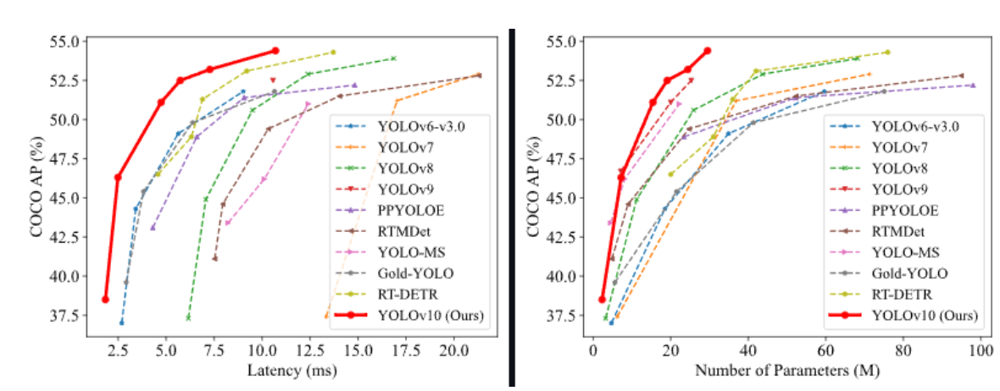

a)  For the first part of the assignment, we want to see how to create the annotation for a custom dataset. You can use the provided html file (annotation_tool.html). When you open the file, upload an image of your desire and assign the proper class. Here you see an image of a raccoon and its chosen class

## (Optional)

The following code is to understand the structure of the JSON file.

In [58]:
import json

# Load the JSON file
with open("/content/Dog.json", "r") as file:
    data = json.load(file)

# Print the JSON structure
print(json.dumps(data, indent=4))


{
    "_via_settings": {
        "ui": {
            "annotation_editor_height": 30,
            "annotation_editor_fontsize": 0.7000000000000001,
            "leftsidebar_width": 18,
            "image_grid": {
                "img_height": 80,
                "rshape_fill": "none",
                "rshape_fill_opacity": 0.3,
                "rshape_stroke": "yellow",
                "rshape_stroke_width": 2,
                "show_region_shape": true,
                "show_image_policy": "all"
            },
            "image": {
                "region_label": "__via_region_id__",
                "region_color": "__via_default_region_color__",
                "region_label_font": "10px Sans",
                "on_image_annotation_editor_placement": "NEAR_REGION"
            }
        },
        "core": {
            "buffer_size": 18,
            "filepath": {},
            "default_filepath": ""
        },
        "project": {
            "name": "Dog"
        }
    },
    "_via_img

Processing: Bruno_1.jpg


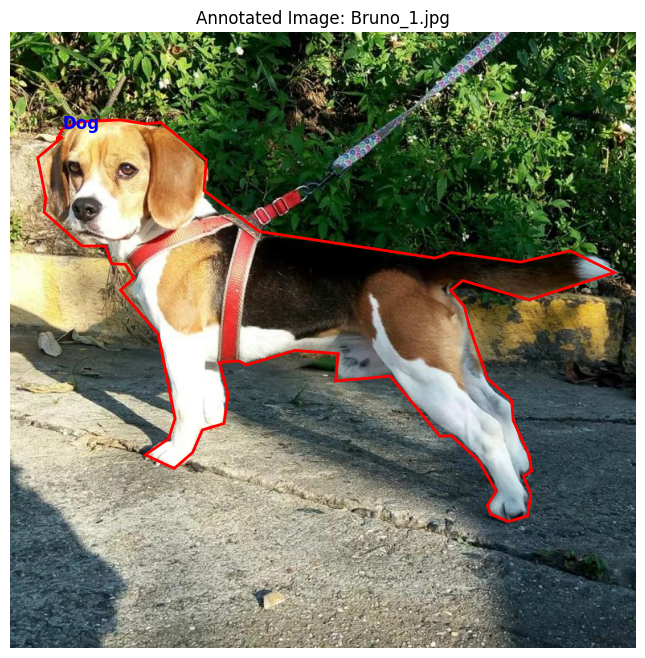

In [61]:
# a- Create annotation
# You can upload the file using ![title](filename.jpeg)
# import image module

import json


# File paths
image_path = "/content/Bruno_1.jpg"
json_path = "/content/Dog.json"

# Load the JSON file
with open(json_path, "r") as file:
    data = json.load(file)

# Extract metadata
img_metadata = data["_via_img_metadata"]

# Loop through the image metadata
for img_id, img_data in img_metadata.items():
    # Load the image file name
    filename = img_data["filename"]
    print(f"Processing: {filename}")

    # Load and display the image
    image = plt.imread(image_path)
    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(image)

    # Process each region
    for region in img_data["regions"]:
        # Extract polygon coordinates
        all_points_x = region["shape_attributes"]["all_points_x"]
        all_points_y = region["shape_attributes"]["all_points_y"]
        label = list(region["region_attributes"].keys())[0]

        # Create a polygon for the annotation
        polygon = patches.Polygon(
            xy=list(zip(all_points_x, all_points_y)),
            closed=True,
            edgecolor="red",
            facecolor="none",
            linewidth=2
        )
        ax.add_patch(polygon)

        # Add the label as text
        plt.text(
            all_points_x[0], all_points_y[0] - 10, label,
            color="blue", fontsize=12, weight="bold"
        )

    plt.axis("off")
    plt.title(f"Annotated Image: {filename}")
    plt.show()




b)  Download required yolo10 tools and check dependencies. Please follow the instructions in this Github page for the information:  https://github.com/ultralytics/ultralytics

In [67]:
#b- Download required tools
# Install the required packages.
import os
HOME = os.getcwd()
!pip install -q git+https://github.com/THU-MIG/yolov10.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [69]:
# Load pretrained weights
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt
!ls -lh {HOME}/weights # For verifying the download weights.

total 408M
-rw-r--r-- 1 root root  80M May 26 15:53 yolov10b.pt
-rw-r--r-- 1 root root 100M May 26 15:53 yolov10l.pt
-rw-r--r-- 1 root root  64M May 26 15:54 yolov10m.pt
-rw-r--r-- 1 root root  11M May 26 15:54 yolov10n.pt
-rw-r--r-- 1 root root  32M May 26 15:54 yolov10s.pt
-rw-r--r-- 1 root root 123M May 26 15:54 yolov10x.pt


c)  Now, we want to test the model out of box. There is an image stored in: “/content/yolov10/ultralytics/assets/bus.jpg”. Apply YOLO10 command to make predictions.
After making the prediction, the result will be stored in “/content/runs/detect/predict/bus.jpg”. Call the image and show the result of prediction.


## Using the reference from Github page, which provides an updated and simplified approach using YOLO with the "ultralytics" library

In [75]:
!pip install ultralytics # Using the lastest version of ultralytics instead of the older yolov10.


/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")



image 1/1 /content/Bruno_1.jpg: 640x640 1 dog, 17.9ms
Speed: 12.5ms preprocess, 17.9ms inference, 313.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


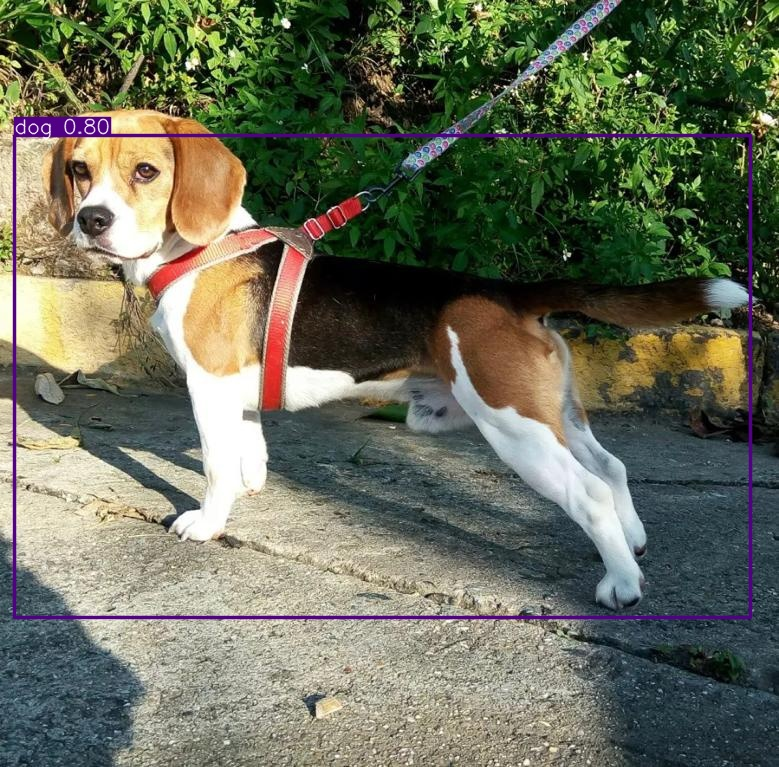

In [76]:
#c- Test the model out of box

from ultralytics import YOLO
from IPython.display import Image, display

# Loading  the YOLO model
model = YOLO("/content/weights/yolov10n.pt")

# Performing  prediction on my upload photo "Bruno"
results = model.predict(
    source="/content/Bruno_1.jpg",  # Replace with your image path
    save=True,  # Save the results
    project="runs/detect",  # Specify output directory
    name="predict",  # Subdirectory name
    exist_ok=True  # Allow overwriting
)

# Displaying the prediction result
result_image_path = "runs/detect/predict/Bruno_1.jpg"
display(Image(filename=result_image_path))


In [81]:
!yolo predict model='/content/weights/yolov10n.pt' source='https://ultralytics.com/images/bus.jpg'

/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")
Ultralytics YO

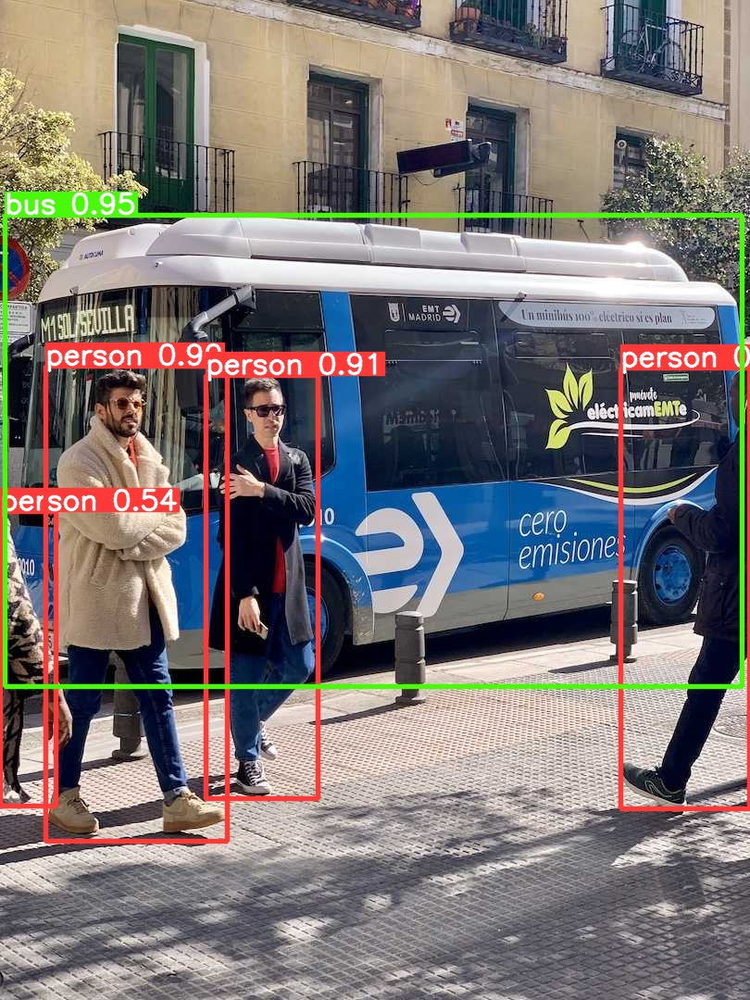

In [83]:
# Displaying the prediction result for the "Assignment photo"
result_image_path = "/content/runs/detect/predict2/bus.jpg"
display(Image(filename=result_image_path))

d)  Now, is the time to try to fine-tune the model. Train the Yolo10n model on coco128.ml. For this part use 10 epochs and 32 batches. Show the confusion matrix which is stored in:
{HOME}/runs/detect/train/confusion_matrix.png
Next, show the learning curves which are stored in: {HOME}/runs/detect/train/results.png


In [85]:
#d- Fine-tune the model
# Show the learning curve and confusion matrix

!yolo task=detect mode=train model=/content/weights/yolov10n.pt data=coco128.yaml epochs=10 batch=32 imgsz=640


/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")
New https://py

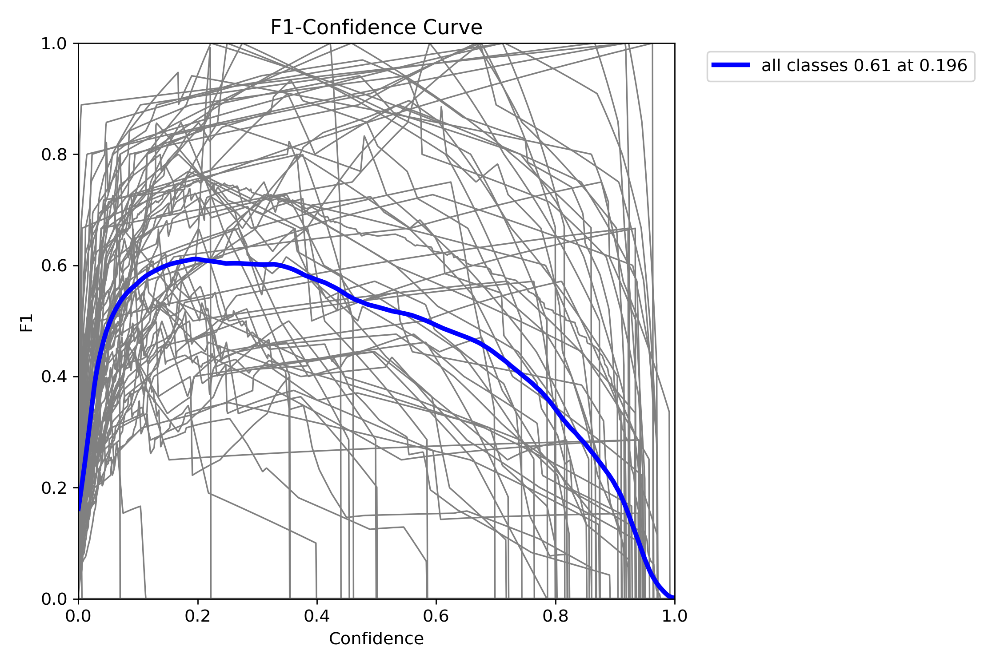

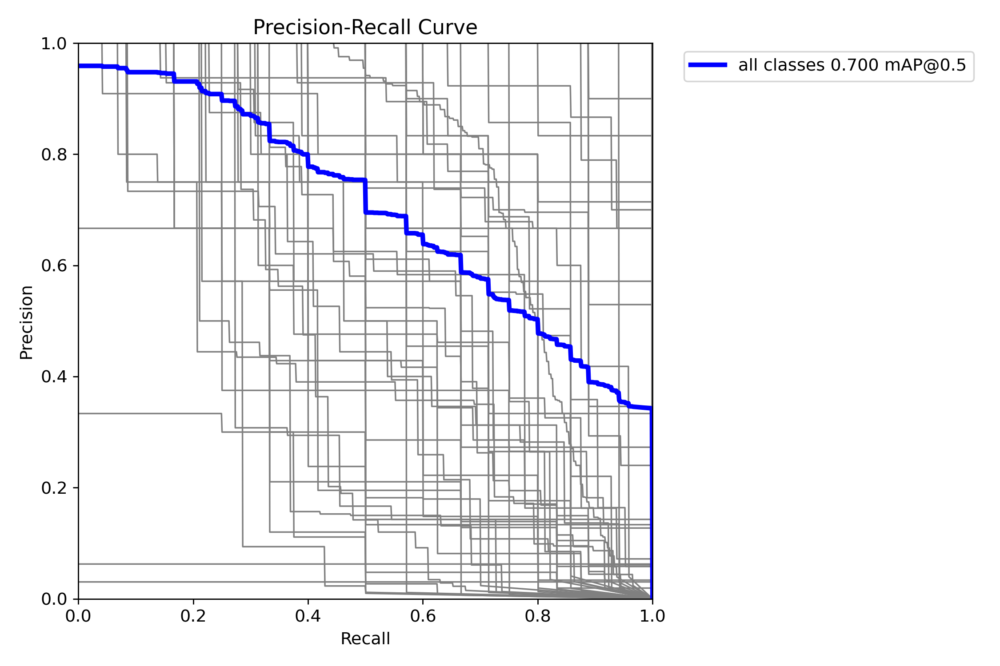

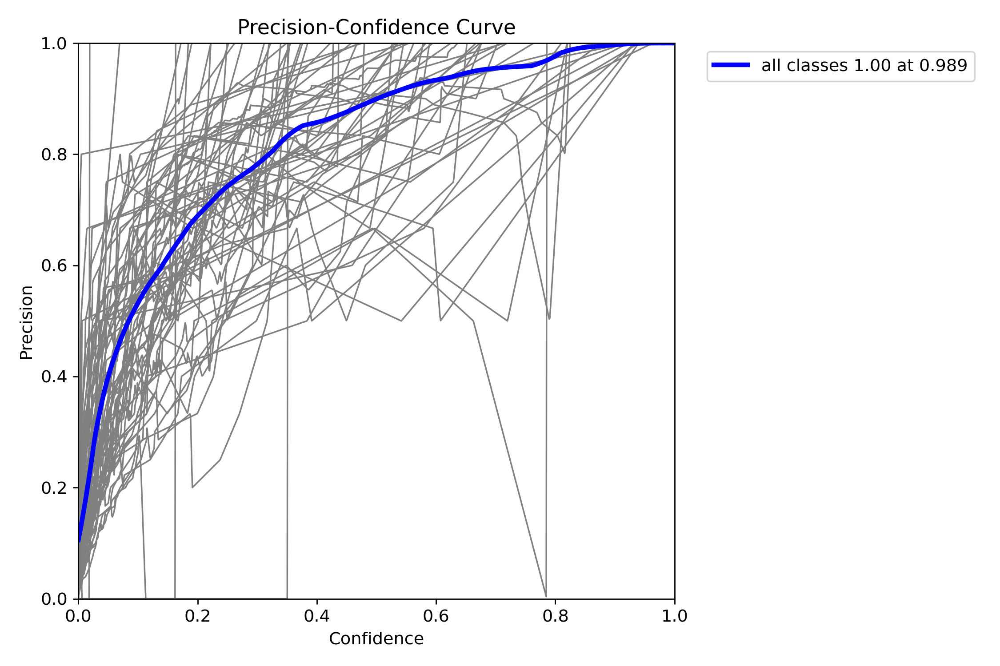

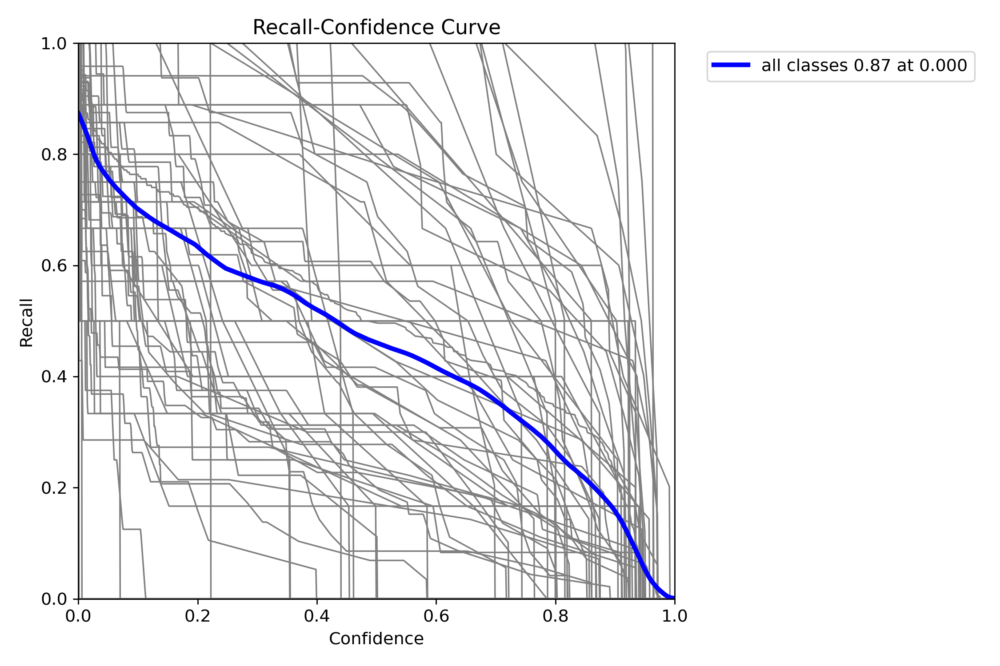

In [86]:
from IPython.display import Image, display

# Defining the directory where the plots are saved
output_dir = "/content/runs/detect/train2"

# Listing of plot files
plot_files = [
    "F1_curve.png",
    "PR_curve.png",
    "P_curve.png",
    "R_curve.png"
]

# Displaying each plot
for plot_file in plot_files:
    display(Image(filename=f"{output_dir}/{plot_file}"))


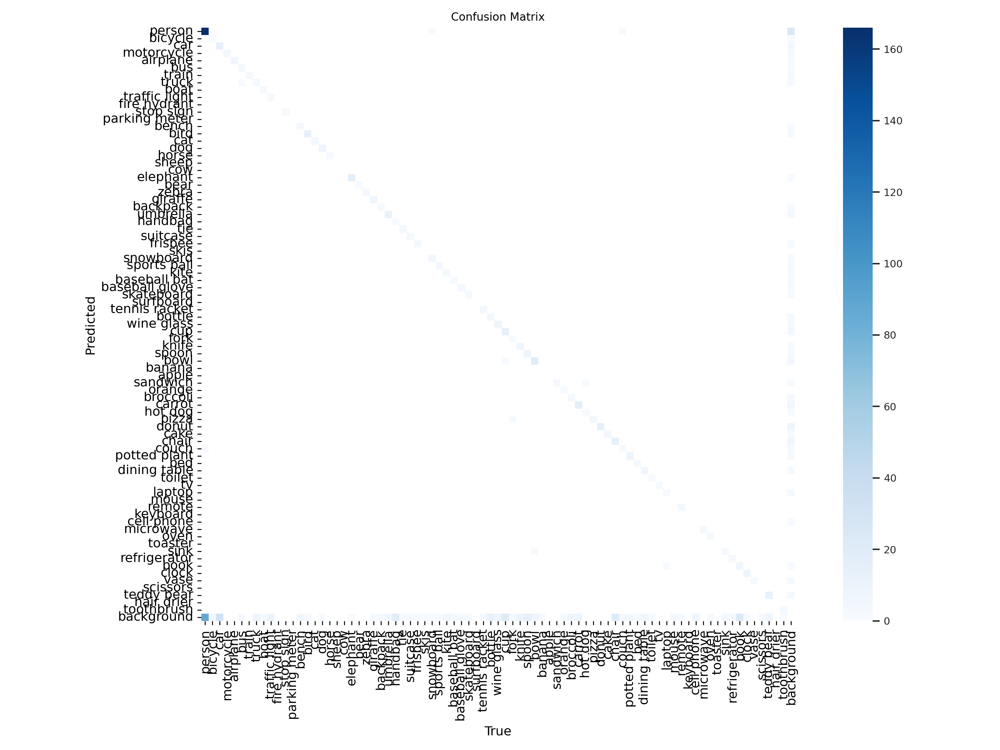

In [87]:
# Displaying the confusion matrix
confusion_matrix_file = f"{output_dir}/confusion_matrix.png"
display(Image(filename=confusion_matrix_file))


## (Option 2) - Running the same training modl for coco128 but without any warnings for checking results variance.

In [2]:
! pip install -U ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 47.4 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Updating dependencies...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.9/227.9 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.1/605.1 kB 44.6 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20
100% 5.35M/5.35M [00:00<00:00, 262MB/s]
Ultralytics 8.3.28 🚀 Python-3.10

100%|██████████| 5.59M/5.59M [00:00<00:00, 327MB/s]

Starting the training process...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/weights/yolov10n.pt, data=coco128.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/runs/detect, name=train2, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1      9856  ultralytics.nn.modules.block.SCDown          [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1     36096  ultralytics.nn.modules.block.SCDown          [128

train: Scanning /content/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]


Plotting labels to /content/runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.68G      2.496      2.655      2.352        184        640: 100%|██████████| 4/4 [00:05<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all        128        929      0.682      0.531      0.631      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       6.5G      2.482      2.739      2.384        325        640: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


                   all        128        929      0.717      0.522      0.633      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.68G      2.504      2.577       2.37        200        640: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all        128        929      0.688      0.546      0.649      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.73G      2.521      2.582      2.387        213        640: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        128        929      0.746      0.544      0.662      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.68G      2.457      2.496      2.337        209        640: 100%|██████████| 4/4 [00:02<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all        128        929      0.673      0.605      0.681      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       6.6G      2.447      2.495      2.336        238        640: 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all        128        929      0.713      0.595       0.69      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.59G      2.407      2.411      2.269        269        640: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.78it/s]

                   all        128        929      0.678      0.604      0.696      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.66G      2.412      2.407      2.272        242        640: 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        128        929      0.799       0.57      0.695      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.49G      2.464      2.419      2.303        237        640: 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all        128        929      0.787      0.584      0.704      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.68G      2.436      2.417      2.285        225        640: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        128        929      0.739      0.597      0.706      0.534



10 epochs completed in 0.037 hours.
Optimizer stripped from /content/runs/detect/train2/weights/last.pt, 5.9MB
Optimizer stripped from /content/runs/detect/train2/weights/best.pt, 5.9MB

Validating /content/runs/detect/train2/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2,762,608 parameters, 0 gradients, 8.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]


                   all        128        929      0.742      0.594      0.706      0.534
                person         61        254      0.861      0.658      0.784      0.574
               bicycle          3          6      0.658      0.325      0.308      0.235
                   car         12         46      0.734      0.283      0.382      0.222
            motorcycle          4          5      0.721        0.8       0.92      0.759
              airplane          5          6       0.86          1      0.995      0.915
                   bus          5          7      0.804      0.714      0.752      0.652
                 train          3          3      0.854          1      0.995      0.808
                 truck          5         12      0.677      0.352      0.426      0.271
                  boat          2          6          1      0.424      0.652      0.357
         traffic light          4         14          1      0.211      0.269      0.168
             stop sig

val: Scanning /content/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]


                   all        128        929       0.77      0.587      0.706      0.534
                person         61        254      0.866      0.634      0.783      0.576
               bicycle          3          6      0.651      0.317      0.309      0.235
                   car         12         46      0.745      0.283      0.376      0.216
            motorcycle          4          5      0.733        0.8      0.906      0.749
              airplane          5          6      0.808          1      0.995      0.906
                   bus          5          7      0.816      0.714      0.747       0.65
                 train          3          3      0.703          1      0.995      0.808
                 truck          5         12      0.679      0.333      0.429      0.272
                  boat          2          6          1      0.358      0.652      0.355
         traffic light          4         14          1      0.207      0.268      0.168
             stop sig

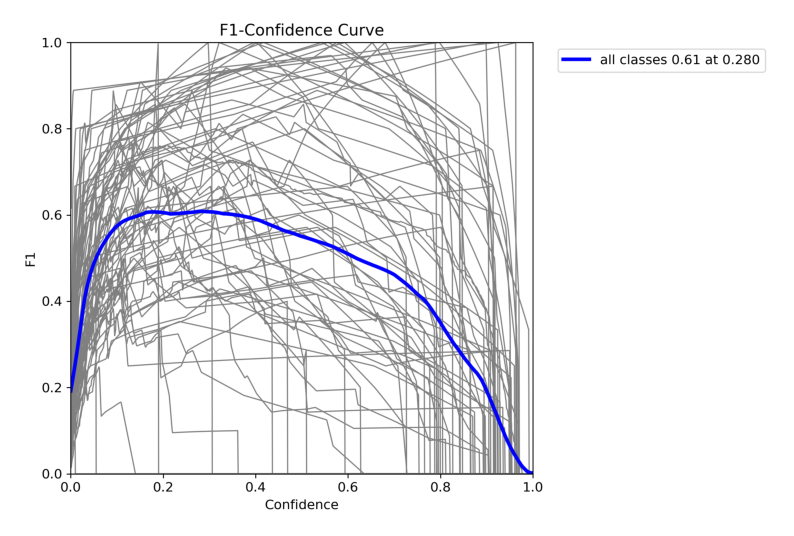

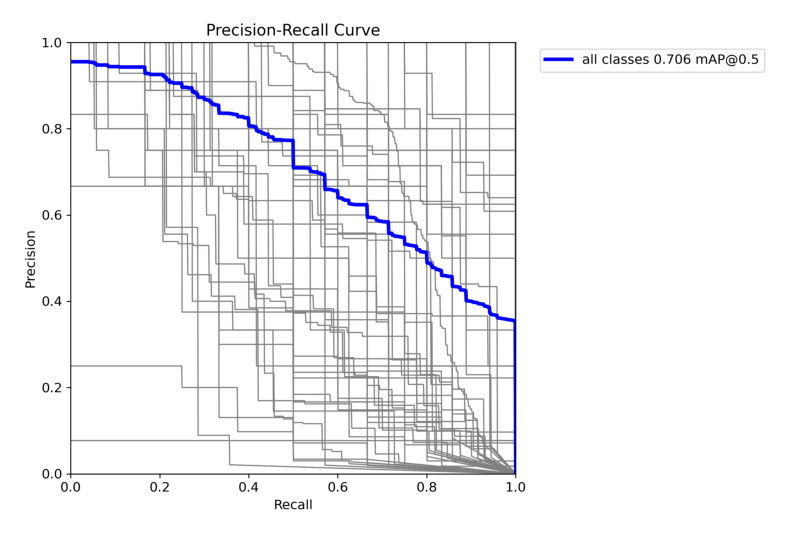

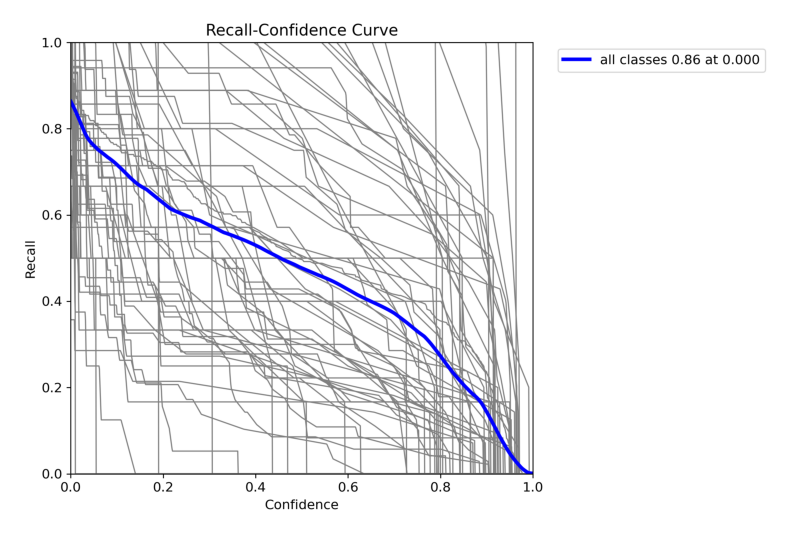

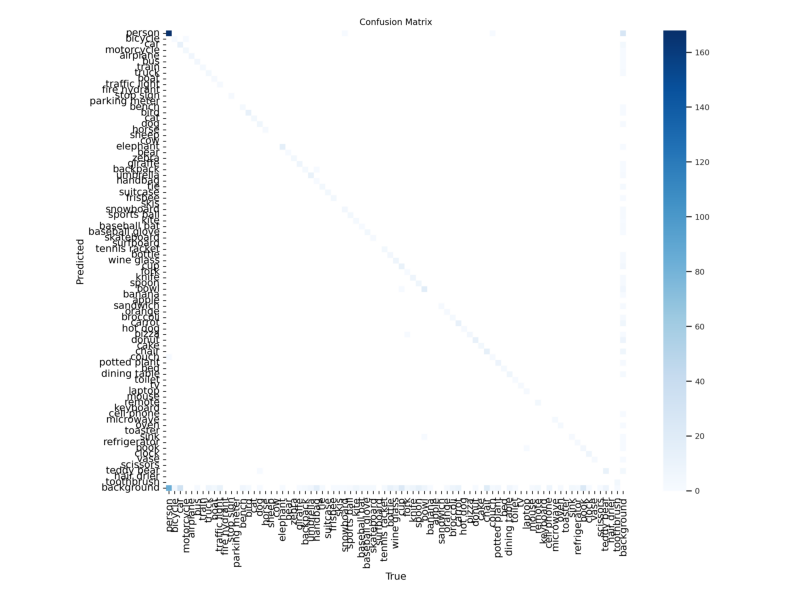

Training and evaluation complete!


In [3]:
# Import necessary libraries
import os
from ultralytics import YOLO

# Set up environment variables and directories
HOME = os.getcwd()
os.makedirs(f"{HOME}/datasets", exist_ok=True)
os.makedirs(f"{HOME}/weights", exist_ok=True)

# Updating dependencies
print("Updating dependencies...")
!pip install -U ultralytics torch albumentations

# Pre-downloading the coco128 dataset
print("Downloading the coco128 dataset...")
!yolo task=detect mode=train data=coco128.yaml epochs=1 imgsz=640 batch=16  # Dummy command to trigger dataset download

# Defining the model path and download weights.
MODEL_PATH = f"{HOME}/weights/yolov10n.pt"
if not os.path.exists(MODEL_PATH):
    print("Downloading YOLOv10n weights...")
    !wget -P {HOME}/weights https://github.com/ultralytics/yolov10/releases/download/v1.1/yolov10n.pt

# Loading the YOLO model
print("Loading the YOLOv10n model...")
model = YOLO(MODEL_PATH)

# Training the model
print("Starting the training process...")
model.train(
    data="coco128.yaml",
    epochs=10,
    batch=32,
    imgsz=640,
    project=f"{HOME}/runs/detect",
    name="train2",
    exist_ok=True
)

# Validate the model
print("Validating the model...")
model.val()

# Displaying learning curves and confusion matrix
import matplotlib.pyplot as plt
from PIL import Image

# Paths for results
curve_paths = [
    f"{HOME}/runs/detect/train2/F1_curve.png",
    f"{HOME}/runs/detect/train2/PR_curve.png",
    f"{HOME}/runs/detect/train2/R_curve.png",
    f"{HOME}/runs/detect/train2/confusion_matrix.png"
]

# Displaying results
for path in curve_paths:
    if os.path.exists(path):
        img = Image.open(path)
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.axis("off")
        plt.show()
    else:
        print(f"Warning: {path} not found.")

print("Training and evaluation complete!")


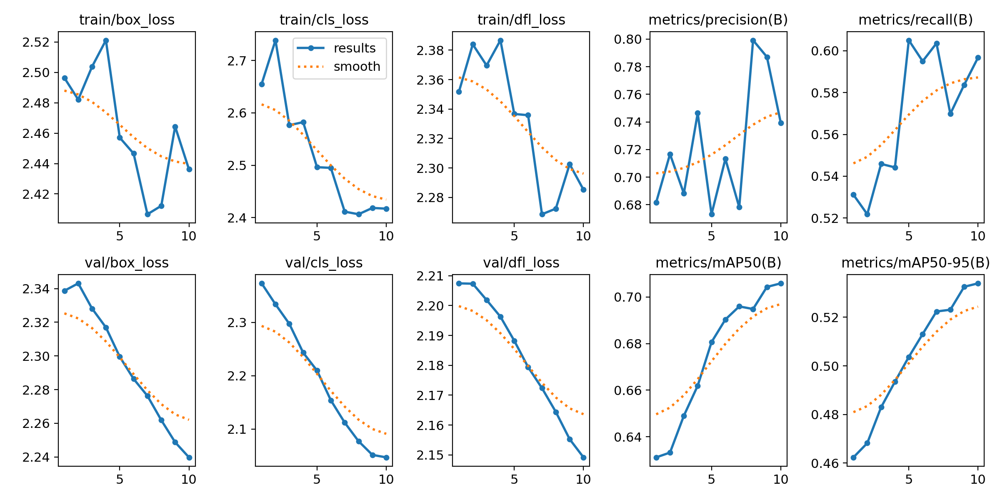

In [4]:
from IPython.display import Image, display

# Path to the results.png
results_path = "/content/runs/detect/train2/results.png"

# Display the results.png
display(Image(filename=results_path))


e)  Explain what you see in the learning curves and confusion matrix.

In [ ]:
# e- SExplain what you see in the learning curves and confusion matrix.

**Learning Curves Analysis**:

1- Training and Validation losses:

- The training losses ( box_loss, cls_loss, dfl_loss) show a downward trend, which indicates that the model is learning from the data and improving its predictions.
- Validation losses also decrease, confirming that the model is generalizing well to unseen data. This confirms that the model did not overfit during training.

2- Precision, recall, and metrics:

- The precision and recall metrics show an increasing trend over epochs, indicating that the model is improving its ability to correctly identify true positives and reduce false negatives.
- The mean average precision (mAP@0.5) and (mAP@0.5-0.95) are also improving, which suggests the model is becoming better at detecting objects across various confidence thresholds.

3- F1 confidence curve:

- The F-1 Confidence curve peaks at a confidence level of approximately 0.280 with an F1 score of 0.61. This indicates the optimal trade-off point between precision and recall. The curve's shape also reflects how well the model performs at various confidence thresholds.

4- Precision- recall curve:

- The PR curve shows how precision varies with recall. The model achieves a mAP of 0.706 at 0.5 IoU. This is a good indicator of the model's ability to balance precision and recall across various classes.

5- Precision- confidence curve:

- The precision consistently increases with confidence, peaking at high confidence levels (0.989). This indicates that the model's predictions at high condifence levels are highly reliable.

6- Recall confidence:

- The recall decreases with increasing confidence. The higher the confidence threshold, the fewer positive predicitons the model makes, leading to a drop in recall.  The recall score starts at 0.87 for low confidence levels.

**Confusion Matrix analysis**:

- The matrix shows that the model performs well for certain dominant classes (e.g., person and car) with a high number of correctly classified samples.

- Misclassifications (off-diagonal entries) appear sparse, indicating the model has relatively few incorrect predictions. However, there may still be room for improvement for less frequent or more challenging classes (e.g., small objects or occluded objects).